# Check dataflow

In [1]:
# !pip install --upgrade albumentations

In [2]:
import sys
sys.path.insert(0, "../code")

In [3]:
data_path = "../input/train_tiles/"
csv_path = "../input/train_tiles/tile_stats.csv"

In [4]:
from dataflow.datasets import get_trainval_datasets, read_img_as_5b_with_mask

In [5]:
train_folds = [0, 1, 3]
val_folds = [2, ]

train_ds, val_ds = get_trainval_datasets(data_path, csv_path, train_folds=train_folds, val_folds=val_folds, 
                                         read_img_mask_fn=read_img_as_5b_with_mask)

In [6]:
len(train_ds), len(val_ds)

(6231, 1888)

Data histograms

In [7]:
import torch
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline


def display_datapoint_hists_per_channel(dp, ylog=True):
    img = dp['image']
    c = img.shape[-1]
    plt.figure(figsize=(5 * c, 5))
    for j in range(c):
        plt.subplot(1, c, j + 1)
        plt.title("channel={}".format(j))
        _ = plt.hist(img[:, :, j].ravel(), bins=255)
        plt.yscale('log')

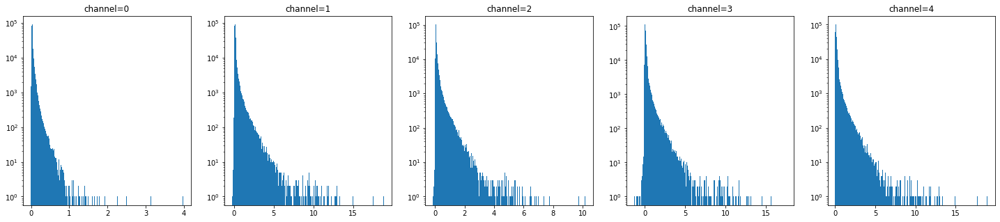

In [8]:
display_datapoint_hists_per_channel(train_ds[0])

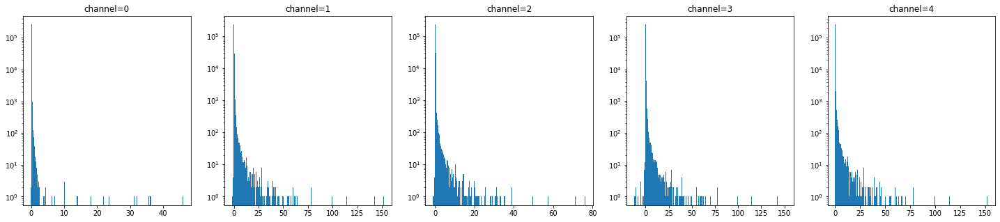

In [9]:
display_datapoint_hists_per_channel(train_ds[10])

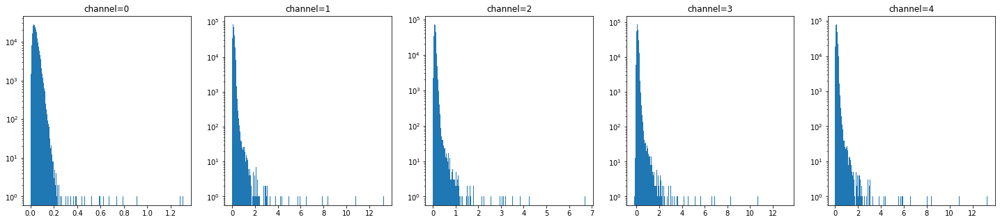

In [10]:
display_datapoint_hists_per_channel(train_ds[100])

Dataloader and visualization

In [10]:
from dataflow.dataloaders import get_train_val_loaders, get_train_sampler

In [11]:
from dataflow.vis import make_grid

import numpy as np
import matplotlib.pylab as plt
%matplotlib inline

In [19]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

train_img_size = 496

mean = (0.1, 0.1, 0.1, 0.0, 1.0)
std = (10.0, 10.0, 10.0, 10.0, 10.0)
max_value = 1.0


train_transforms = A.Compose([
    A.RandomCrop(train_img_size, train_img_size),
    A.OneOf([
        A.RandomRotate90(),
        A.Flip(),        
    ]),
    A.Normalize(mean=mean, std=std, max_pixel_value=max_value),
    ToTensorV2()
])


val_transforms = A.Compose([
    A.Normalize(mean=mean, std=std, max_pixel_value=max_value),
    ToTensorV2()
])

In [20]:
train_sampler = get_train_sampler(train_ds, weight_per_class=(0.7, 0.3))

In [21]:
!ls /tmp/unosat

'train_sampler_weights_6198__[0.5_0.5].pth'
'train_sampler_weights_6231__(0.65_0.35).pth'
'train_sampler_weights_6231__(0.7_0.3).pth'


In [22]:
train_loader, val_loader, train_eval_loader = get_train_val_loaders(
    train_ds,
    val_ds,
    train_transforms=train_transforms,
    val_transforms=val_transforms,
    batch_size=4,
    num_workers=10,
    val_batch_size=4,
    train_sampler=train_sampler
)

In [23]:
train_loader_iter = iter(train_loader)
val_loader_iter = iter(val_loader)
train_eval_loader_iter = iter(train_eval_loader)

Train loader

In [24]:
batch = next(train_loader_iter)

In [25]:
batch['image'].max(), batch['image'].min()

(tensor(2.6993), tensor(-0.0998))

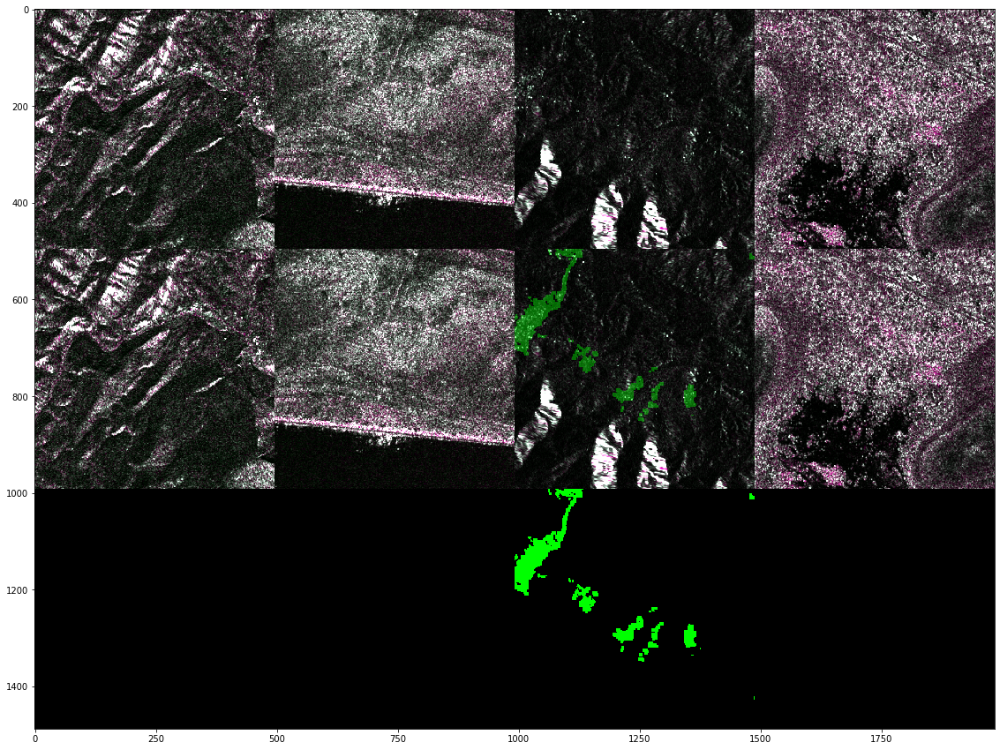

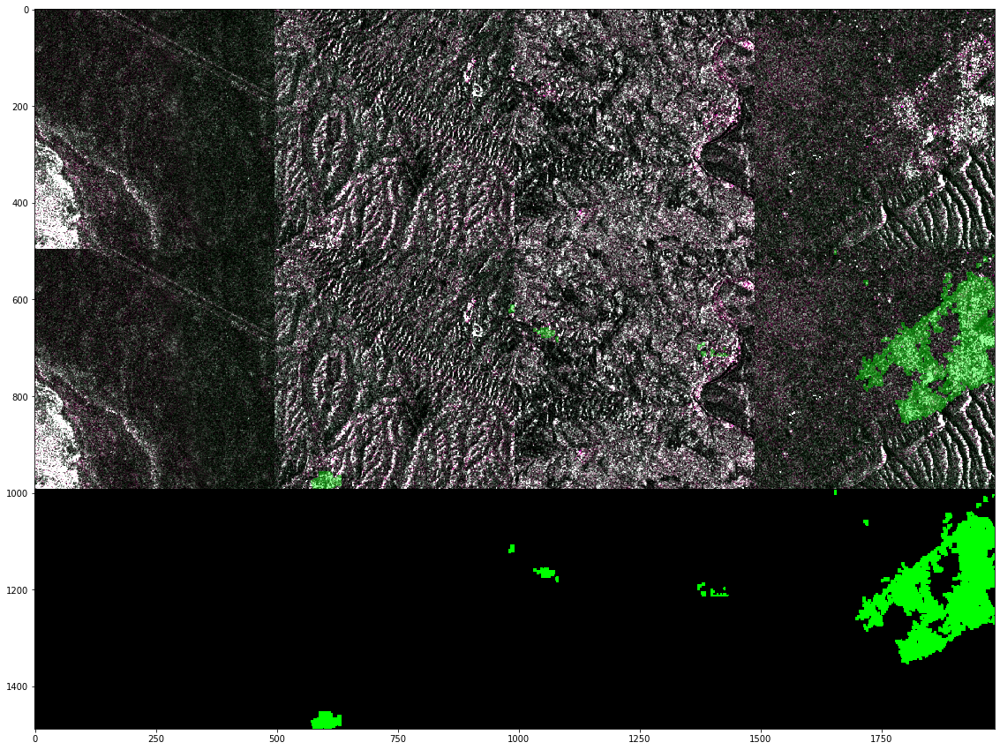

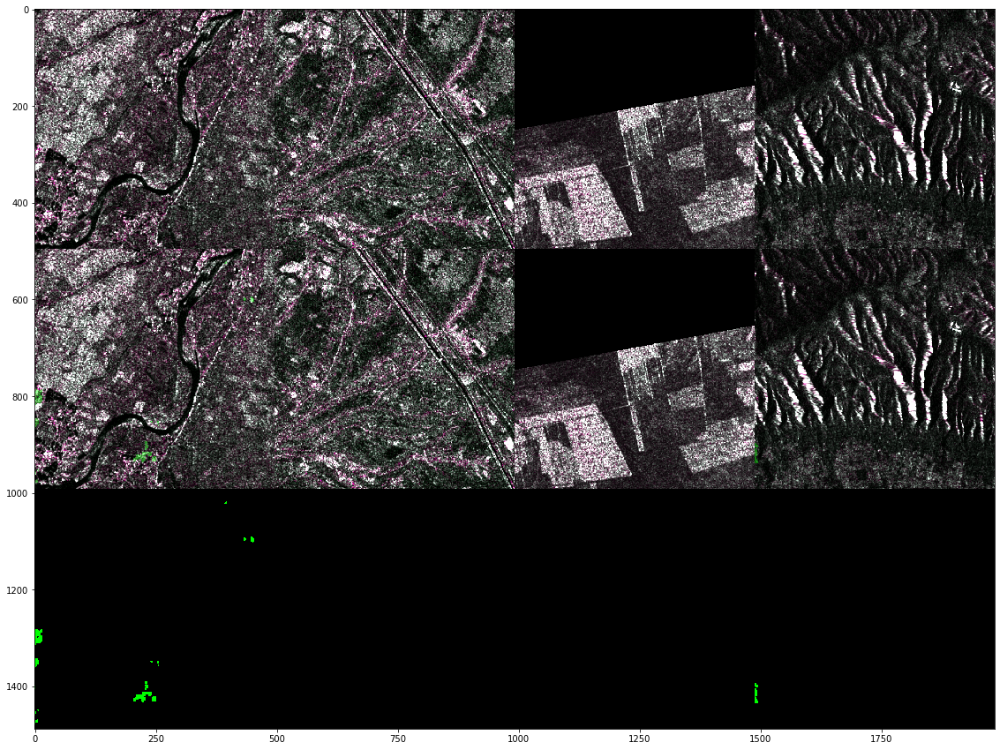

In [29]:
from functools import partial


for _ in range(3):
    batch = next(train_loader_iter)

    batch_x = batch['image']
    batch_y = batch['mask']
    
    plt.figure(figsize=(30, 15))
    grid_pred_gt = make_grid(batch_x[:, (2, 3, 4), :, :], batch_y, 
                             img_denormalize_fn=lambda x: x)
    plt.imshow(grid_pred_gt)

Val loader

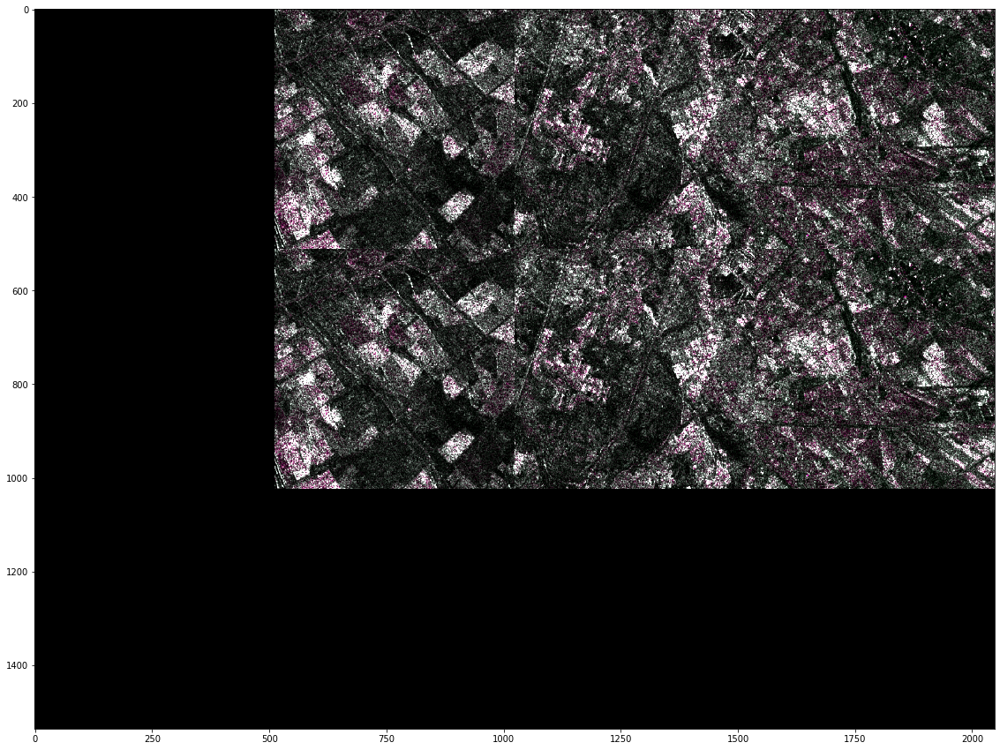

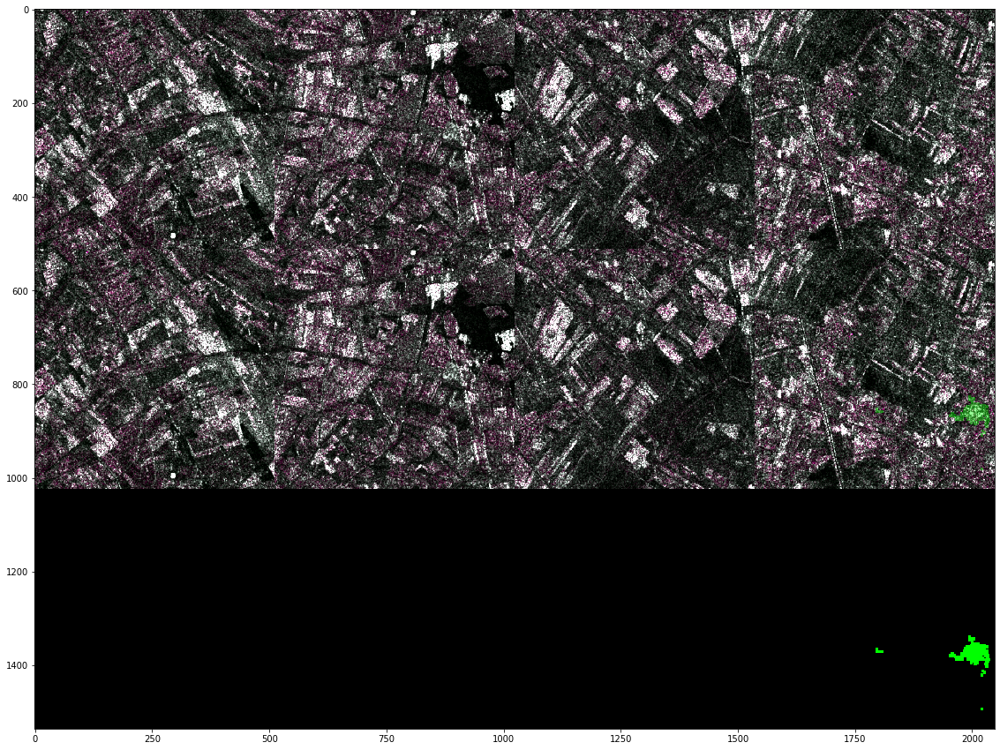

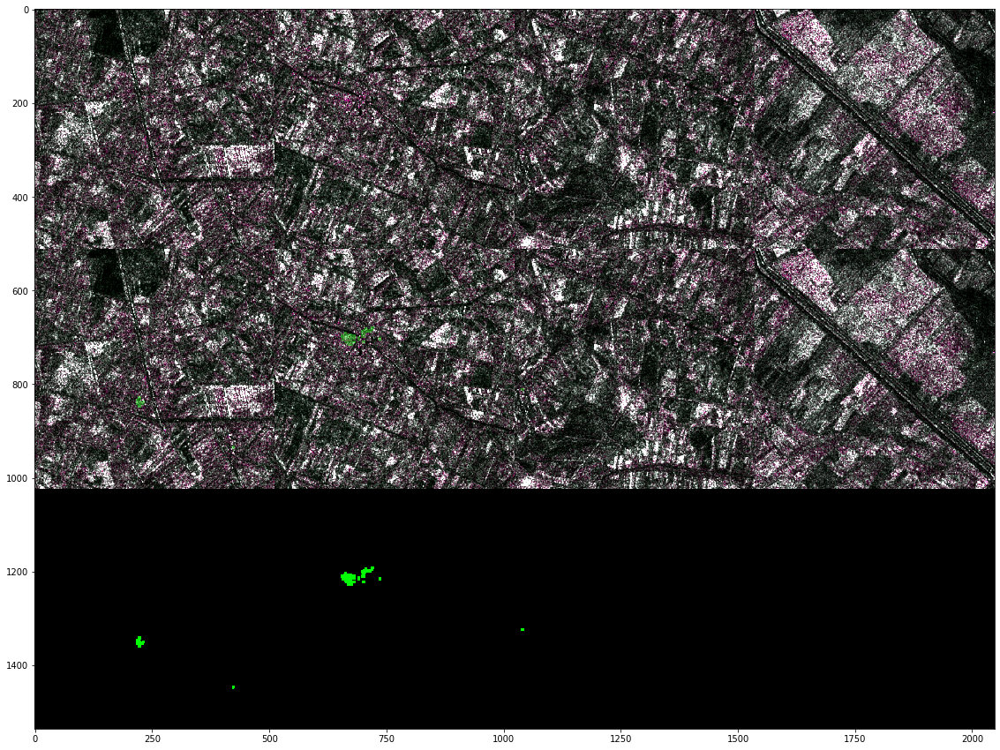

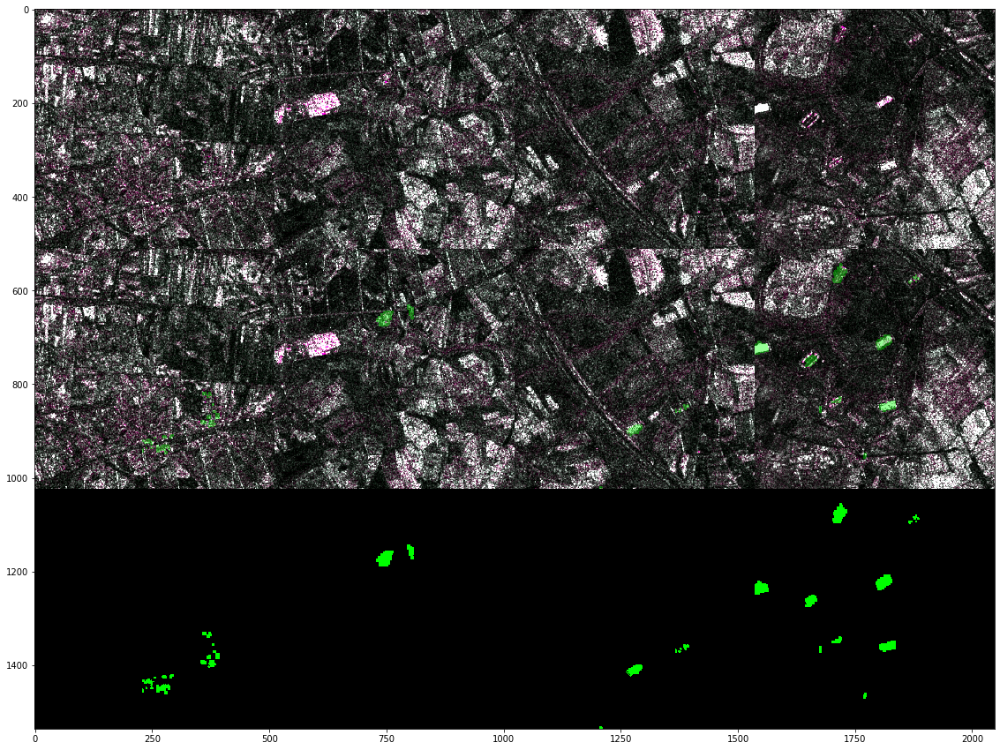

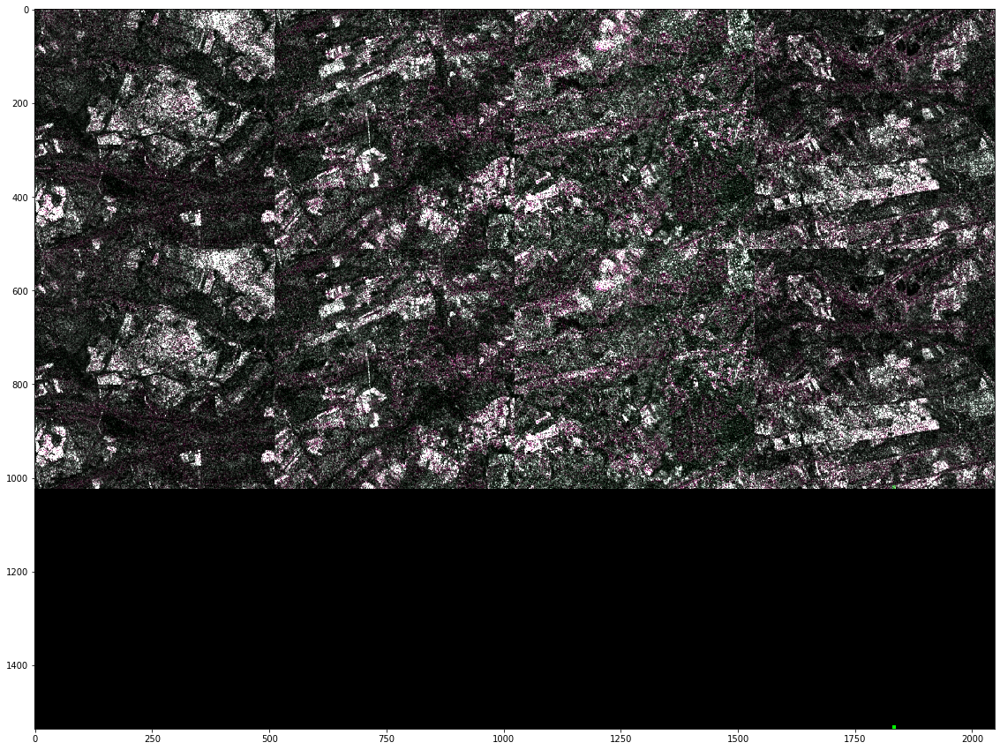

In [30]:
from functools import partial


for _ in range(5):
    batch = next(val_loader_iter)

    batch_x = batch['image']
    batch_y = batch['mask']
    
    plt.figure(figsize=(30, 15))
    grid_pred_gt = make_grid(batch_x[:, (2, 3, 4), :, :], batch_y, 
                             img_denormalize_fn=lambda x: x)
    plt.imshow(grid_pred_gt)

In [24]:
from ignite.metrics import ConfusionMatrix
from ignite.metrics.confusion_matrix import cmPrecision, cmRecall

In [25]:
cm = ConfusionMatrix(2)

In [26]:
pr = cmPrecision(cm, average=False)

In [27]:
type(pr)

ignite.metrics.metrics_lambda.MetricsLambda